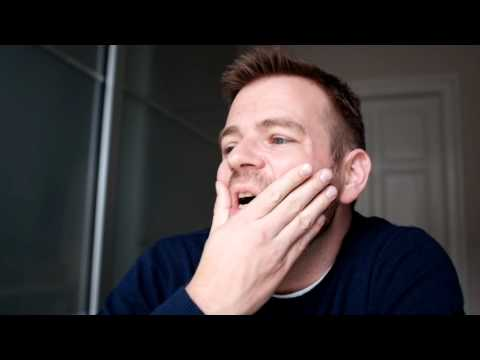

In [2]:
from IPython.display import YouTubeVideo
YouTubeVideo("Rwakh-HXPJk",width=800, height=450)

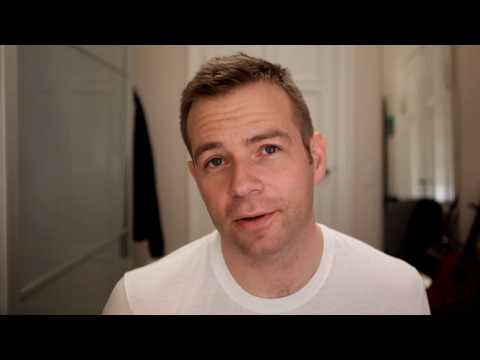

In [3]:
YouTubeVideo("FSRoqXw28RI",width=800, height=450)

# Exercise: Use the concept of modularity to explore how community-like the genres are.

### Explain the concept of modularity in your own words.
Modularity is a measure of how well a network is divided into communities. It compares the density of links inside communities with links between communities.

In [5]:
import json

# Load the genre data
with open('genre.txt', 'r') as file:  # Replace 'genres.txt' with your file's name
    genre_data = json.load(file)


In [6]:
import networkx as nx

# Initialize the undirected graph
G = nx.Graph()

# Add nodes and edges based on shared genres
for artist, genres in genre_data.items():
    # Add a node for each artist
    G.add_node(artist)
    
    # Connect artists that share genres
    for other_artist, other_genres in genre_data.items():
        if artist != other_artist and set(genres) & set(other_genres):  # Check for common genres
            G.add_edge(artist, other_artist)


In [8]:
# We now assign each artist to a community based on their first genre.
# Assign communities based on the first genre
communities = {}
for artist, genres in genre_data.items():
    first_genre = genres[0]
    if first_genre not in communities:
        communities[first_genre] = []
    communities[first_genre].append(artist)

# Create a partition dictionary for modularity calculation
partition = {artist: genres[0] for artist, genres in genre_data.items()}


In [9]:
# Calculate Modularity:
# Modularity is a measure of the strength of division of a network into communities. We can calculate it using the modularity function in NetworkX.
# Calculate modularity
modularity = nx.algorithms.community.modularity(G, [set(group) for group in communities.values()])

print("Modularity:", modularity)


Modularity: 0.014397552317356939


In [10]:
# Since you mentioned that many artists have "country" as their first genre, we can try assigning the second genre for those with multiple genres and re-calculate the modularity.
# Reassign genres, avoiding "country" where possible
improved_partition = {}
for artist, genres in genre_data.items():
    primary_genre = genres[0] if len(genres) == 1 else genres[1]  # Take second genre if available
    improved_partition[artist] = primary_genre

# Recalculate modularity with the new partition
improved_communities = {}
for artist, genre in improved_partition.items():
    if genre not in improved_communities:
        improved_communities[genre] = []
    improved_communities[genre].append(artist)

improved_modularity = nx.algorithms.community.modularity(G, [set(group) for group in improved_communities.values()])

print("Improved Modularity:", improved_modularity)


Improved Modularity: 0.015051601971551712


# Exercise: Community detection finding structral communities in the network

In [12]:
import community as community_louvain  # Louvain library
import matplotlib.pyplot as plt

# Use the previously created network 'G'
# Run Louvain algorithm to find communities
partition_louvain = community_louvain.best_partition(G)

# Calculate modularity of the Louvain communities
modularity_louvain = community_louvain.modularity(partition_louvain, G)

print("Louvain Modularity:", modularity_louvain)


Louvain Modularity: 0.03423292068023764


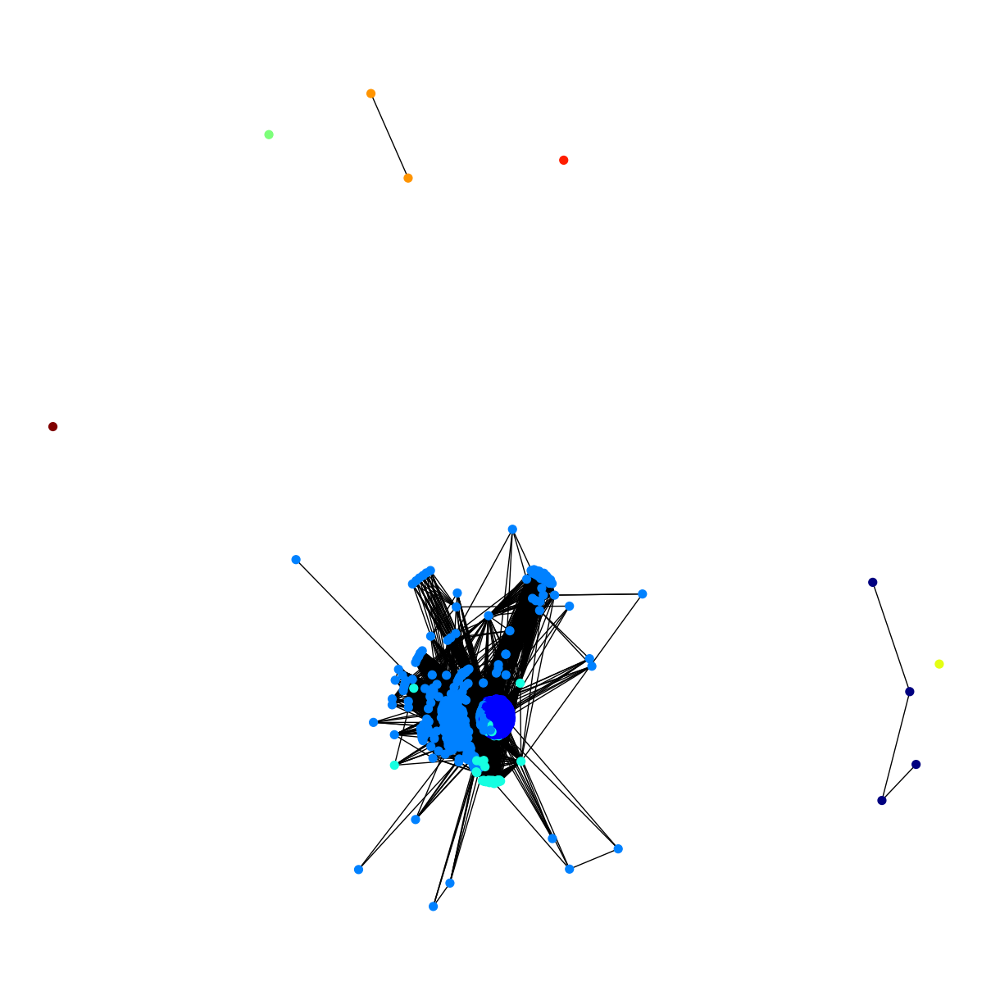

In [13]:
# Visualize with Force Atlas
pos = nx.spring_layout(G, k=0.1)  # Force Atlas layout
plt.figure(figsize=(12, 12))

# Color nodes by their Louvain community
colors = [partition_louvain[node] for node in G.nodes()]
nx.draw(G, pos, node_color=colors, with_labels=False, node_size=50, cmap=plt.cm.jet)
plt.show()


# Exercise: Communities versus genres.

In [14]:
from collections import Counter
import numpy as np
import pandas as pd

# 1. Count the most common genres
all_genres = [genre for genres in genre_data.values() for genre in genres]
most_common_genres = [item[0] for item in Counter(all_genres).most_common(7)]

# 2. Count the most common communities (from Louvain partition)
community_counts = Counter(partition_louvain.values())
most_common_communities = [item[0] for item in community_counts.most_common(7)]

# 3. Create confusion matrix
confusion_matrix = np.zeros((7, 7))  # 7 genres x 7 communities

for artist, genres in genre_data.items():
    # Only consider the artist if they are in one of the top genres and top communities
    artist_community = partition_louvain.get(artist)
    if artist_community in most_common_communities:
        for genre in genres:
            if genre in most_common_genres:
                genre_index = most_common_genres.index(genre)
                community_index = most_common_communities.index(artist_community)
                confusion_matrix[genre_index, community_index] += 1

# 4. Create a pandas DataFrame for easier visualization
confusion_df = pd.DataFrame(confusion_matrix, index=most_common_genres, columns=most_common_communities)
print(confusion_df)


                   1      2     3    0    6    7    4
country       1164.0  281.0  54.0  0.0  0.0  0.0  0.0
folk            52.0  125.0   1.0  0.0  0.0  0.0  0.0
country rock     0.0  171.0   0.0  0.0  0.0  0.0  0.0
pop             58.0   90.0   9.0  0.0  0.0  0.0  0.0
americana        0.0  156.0   1.0  0.0  0.0  0.0  0.0
bluegrass       36.0   89.0   4.0  0.0  0.0  0.0  0.0
rock            24.0   89.0   3.0  0.0  0.0  0.0  0.0


Looking at your confusion matrix, here’s what we can observe:

"Country" and Community 1: The majority of artists with the genre "country" are in Community 1, suggesting a strong alignment between this genre and that community.
Other genres: Genres like "folk," "americana," and "bluegrass" are more spread out, with significant overlaps with Community 2.
Genre overlaps: The matrix shows that some genres like "country rock" and "americana" mostly belong to Community 2.
Conclusion:
The confusion matrix suggests that genres like "country" strongly correspond to specific communities (especially Community 1), but other genres like "folk" and "pop" are spread across multiple communities. This indicates that the detected communities don't always perfectly align with genres, revealing that structural communities in the network might be influenced by factors beyond just genre classification.

# Part 3: Words that characterize pages or groups of pages


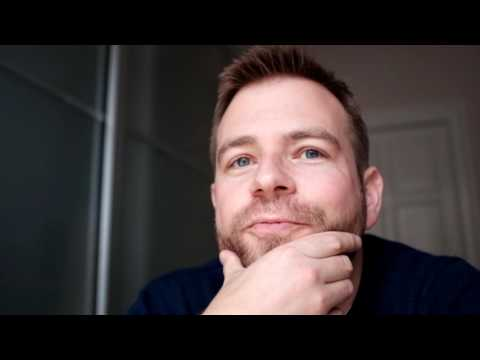

In [15]:
YouTubeVideo("wkYvdfkVmlI",width=800, height=450)

In [18]:
import os

# Folder containing the artist files
folder_path = 'country_music_performers'

def read_files_in_folder(folder):
    all_text = ""
    for filename in os.listdir(folder):
        file_path = os.path.join(folder, filename)
        with open(file_path, 'r', encoding='utf-8') as file:
            all_text += file.read() + " "  # Add space between each file's content
    return all_text

# Read all country artist files
country_text = read_files_in_folder(folder_path)

# Now preprocess the text and build TF list using the method shown previously


In [19]:
import nltk
from nltk.tokenize import word_tokenize
from collections import Counter
import string

nltk.download('punkt')
nltk.download('wordnet')
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# Initialize lemmatizer
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

def preprocess_text(text):
    # Tokenize
    tokens = word_tokenize(text)
    
    # Remove punctuation and convert to lowercase
    tokens = [word.lower() for word in tokens if word.isalnum()]
    
    # (Optional) Lemmatize
    tokens = [lemmatizer.lemmatize(word) for word in tokens if word not in stop_words]
    
    return tokens


# Pre-process the text
country_tokens = preprocess_text(country_text)

# Get word counts (Term Frequency)
country_tf = Counter(country_tokens)

# List top 15 words for the country genre
print(country_tf.most_common(15))


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/victorwintherlarsen/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/victorwintherlarsen/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


[('ref', 81024), ('cite', 55666), ('country', 47488), ('album', 43482), ('music', 34688), ('song', 30612), ('category', 23394), ('center', 22416), ('year', 19686), ('2', 18701), ('award', 17958), ('record', 17322), ('single', 17176), ('row', 16429), ('american', 15992)]


In [20]:
# Define a list of unwanted tokens to remove
unwanted_tokens = {'ref', 'cite', 'category', 'center', 'row', '2', 'year'}

# Filter the tokens
filtered_country_tf = {word: count for word, count in country_tf.items() if word not in unwanted_tokens}

# Get the top 15 words after filtering
top_15_filtered = Counter(filtered_country_tf).most_common(15)
print("Filtered Top 15 words for 'country' genre:", top_15_filtered)


Filtered Top 15 words for 'country' genre: [('country', 47488), ('album', 43482), ('music', 34688), ('song', 30612), ('award', 17958), ('record', 17322), ('single', 17176), ('american', 15992), ('released', 14319), ('web', 13756), ('artist', 13091), ('chart', 12956), ('new', 12375), ('band', 12138), ('http', 11121)]


In [23]:
# Count the occurrences of each genre across all artists
genre_counts = Counter(genre for genres in genre_data.values() for genre in genres)
# Get the 15 most common genres
most_common_genres = genre_counts.most_common(15)

# Print the 15 most common genres and their counts
print("Top 15 Genres:", most_common_genres)

Top 15 Genres: [('country', 1499), ('folk', 178), ('country rock', 171), ('pop', 157), ('americana', 157), ('bluegrass', 129), ('rock', 116), ('country pop', 109), ('gospel', 96), ('rockabilly', 80), ('blues', 79), ('alternative country', 73), ('folk rock', 60), ('southern rock', 51), ('rock and roll', 50)]


In [24]:
import os

# Folder where the artist files are stored
artist_folder = 'country_music_performers'

# Function to aggregate text for a specific genre
def aggregate_genre_text(genre_name, genre_data):
    genre_text = ""
    
    for artist, genres in genre_data.items():
        # If the artist belongs to this genre
        if genre_name in genres:
            # Convert artist name to file format (underscore instead of spaces)
            artist_file = artist.replace(" ", "_") + '.txt'
            artist_path = os.path.join(artist_folder, artist_file)
            
            # Check if the artist's file exists and read its content
            if os.path.exists(artist_path):
                with open(artist_path, 'r', encoding='utf-8') as file:
                    genre_text += file.read() + "\n"  # Add a newline between files
    
    return genre_text

# Top 15 genres
top_genres = ['country', 'folk', 'country rock', 'pop', 'americana', 'bluegrass', 
              'rock', 'country pop', 'gospel', 'rockabilly', 'blues', 
              'alternative country', 'folk rock', 'southern rock', 'rock and roll']

# Load the genre data
with open('genre.txt', 'r') as file:  # Replace with your genre file path
    genre_data = json.load(file)

# Create a folder to save the aggregated genre documents
output_folder = 'aggregated_genre_documents'
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Create and save documents for each genre
for genre in top_genres:
    genre_text = aggregate_genre_text(genre, genre_data)
    
    # Save the aggregated text to a file
    output_file = os.path.join(output_folder, f'{genre}_document.txt')
    with open(output_file, 'w', encoding='utf-8') as output:
        output.write(genre_text)

    print(f"Saved document for genre: {genre}")


Saved document for genre: country
Saved document for genre: folk
Saved document for genre: country rock
Saved document for genre: pop
Saved document for genre: americana
Saved document for genre: bluegrass
Saved document for genre: rock
Saved document for genre: country pop
Saved document for genre: gospel
Saved document for genre: rockabilly
Saved document for genre: blues
Saved document for genre: alternative country
Saved document for genre: folk rock
Saved document for genre: southern rock
Saved document for genre: rock and roll


In [34]:
import os
from collections import Counter
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

# Initialize lemmatizer and stopwords
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))
unwanted_tokens = {'ref', 'cite', 'center', 'category', 'year', 'row', '2','album','song','music'}

# Preprocess text: tokenize, lowercase, remove punctuation, stopwords, unwanted tokens, and (optional) lemmatize
def preprocess_text(text):
    tokens = word_tokenize(text)
    tokens = [word.lower() for word in tokens if word.isalnum()]  # Remove punctuation
    tokens = [lemmatizer.lemmatize(word) for word in tokens if word not in stop_words and word not in unwanted_tokens]  # Remove stopwords and unwanted tokens
    return tokens

# Function to aggregate and build TF list for a specific genre
def aggregate_tf_for_genre(genre_name, genre_data, artist_folder):
    genre_text = ""
    
    # Aggregate text for all artists in this genre
    for artist, genres in genre_data.items():
        if genre_name in genres:
            artist_file = artist.replace(" ", "_") + '.txt'
            artist_path = os.path.join(artist_folder, artist_file)
            if os.path.exists(artist_path):
                with open(artist_path, 'r', encoding='utf-8') as file:
                    genre_text += file.read() + " "  # Append text
    
    # Preprocess the aggregated text
    tokens = preprocess_text(genre_text)
    
    # Count term frequencies (TF)
    tf_list = Counter(tokens)
    
    # Filter out rare words (less than 5 occurrences)
    tf_list_filtered = {word: count for word, count in tf_list.items() if count >= 5}
    
    return tf_list_filtered

# Function to save the TF list for each genre
def save_tf_list(genre_name, tf_list, output_folder):
    file_path = os.path.join(output_folder, f'{genre_name}_tf_list.txt')
    with open(file_path, 'w', encoding='utf-8') as file:
        for word, count in tf_list.items():
            file.write(f"{word} {count}\n")

# Top 15 genres and paths
top_genres = ['country', 'folk', 'country rock', 'pop', 'americana', 'bluegrass', 
              'rock', 'country pop', 'gospel', 'rockabilly', 'blues', 
              'alternative country', 'folk rock', 'southern rock', 'rock and roll']

artist_folder = 'country_music_performers'
output_folder = 'tf_lists'

# Make sure the output folder exists
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Load the genre data
with open('genre.txt', 'r') as file:
    genre_data = json.load(file)

# Generate and save TF lists for each genre
for genre in top_genres:
    tf_list = aggregate_tf_for_genre(genre, genre_data, artist_folder)
    save_tf_list(genre, tf_list, output_folder)
    print(f"Saved TF list for genre: {genre}")


[nltk_data] Downloading package punkt to
[nltk_data]     /Users/victorwintherlarsen/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/victorwintherlarsen/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/victorwintherlarsen/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Saved TF list for genre: country
Saved TF list for genre: folk
Saved TF list for genre: country rock
Saved TF list for genre: pop
Saved TF list for genre: americana
Saved TF list for genre: bluegrass
Saved TF list for genre: rock
Saved TF list for genre: country pop
Saved TF list for genre: gospel
Saved TF list for genre: rockabilly
Saved TF list for genre: blues
Saved TF list for genre: alternative country
Saved TF list for genre: folk rock
Saved TF list for genre: southern rock
Saved TF list for genre: rock and roll


In [35]:
import os
from collections import Counter

# Function to list top 15 words for each genre and print comments
def list_top_15_words(genre_name, tf_list):
    # Get the top 15 words
    top_15_words = Counter(tf_list).most_common(15)
    
    # Print the genre and top 15 words
    print(f"Top 15 words for '{genre_name}' genre:")
    for word, count in top_15_words:
        print(f"{word}: {count}")
    
    # Comment on the top 15 words
    print(f"\nComment: For the '{genre_name}' genre, these words reflect key aspects such as themes, artist types, or other genre-specific details.")
    print("-" * 50)

# Function to process all 15 genres and print top 15 words + comments
def process_top_15_words_for_genres(top_genres, output_folder):
    for genre in top_genres:
        file_path = os.path.join(output_folder, f'{genre}_tf_list.txt')
        if os.path.exists(file_path):
            # Read the term frequency list from the saved file
            with open(file_path, 'r', encoding='utf-8') as file:
                tf_list = {}
                for line in file:
                    word, count = line.split()
                    tf_list[word] = int(count)
            
            # List top 15 words and print comments
            list_top_15_words(genre, tf_list)

# Define top 15 genres
top_genres = ['country', 'folk', 'country rock', 'pop', 'americana', 'bluegrass', 
              'rock', 'country pop', 'gospel', 'rockabilly', 'blues', 
              'alternative country', 'folk rock', 'southern rock', 'rock and roll']

# Folder containing the saved TF lists
output_folder = 'tf_lists'

# Process all genres and list top 15 words
process_top_15_words_for_genres(top_genres, output_folder)



Top 15 words for 'country' genre:
country: 38571
single: 13484
award: 12775
record: 12767
american: 11228
artist: 9972
released: 9964
chart: 9776
web: 9192
new: 8301
song: 7900
billboard: 7743
first: 7682
magazine: 7311
band: 7243

Comment: For the 'country' genre, these words reflect key aspects such as themes, artist types, or other genre-specific details.
--------------------------------------------------
Top 15 words for 'folk' genre:
country: 3190
american: 2212
award: 2188
record: 2009
http: 1833
web: 1780
new: 1675
song: 1617
released: 1563
magazine: 1539
band: 1517
time: 1515
artist: 1462
first: 1418
folk: 1240

Comment: For the 'folk' genre, these words reflect key aspects such as themes, artist types, or other genre-specific details.
--------------------------------------------------
Top 15 words for 'country rock' genre:
country: 5886
band: 3212
award: 2564
released: 1996
single: 1977
american: 1922
rock: 1882
record: 1815
new: 1738
web: 1663
artist: 1535
http: 1457
first: 1

# Part 4: Visualization

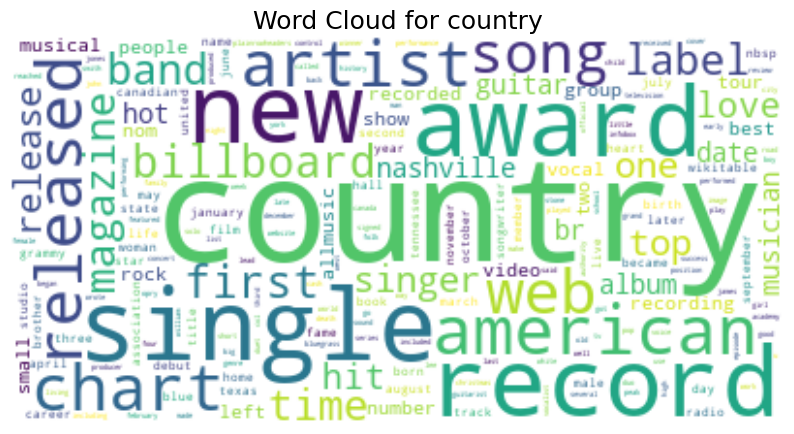

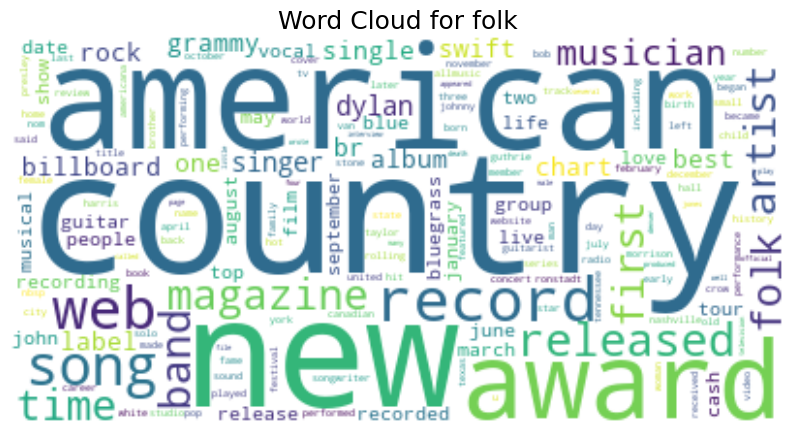

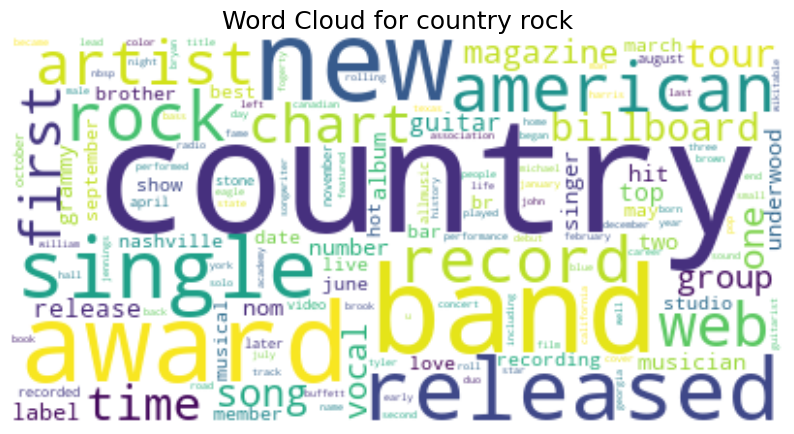

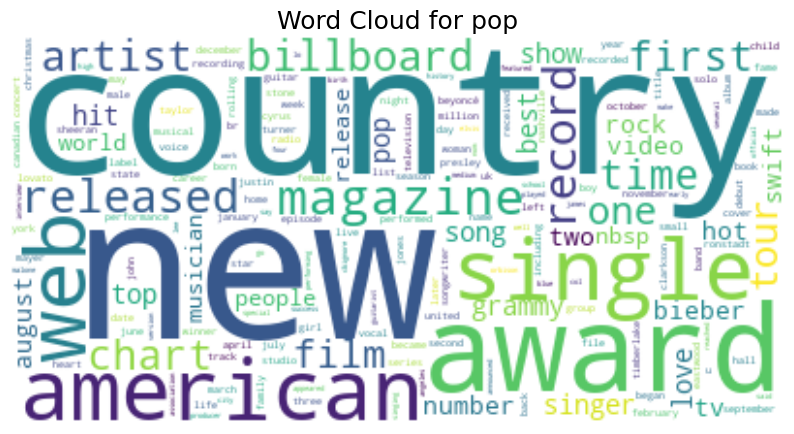

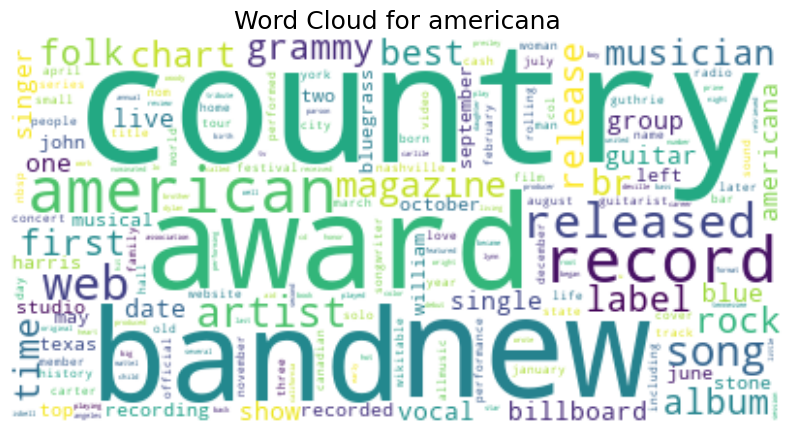

...

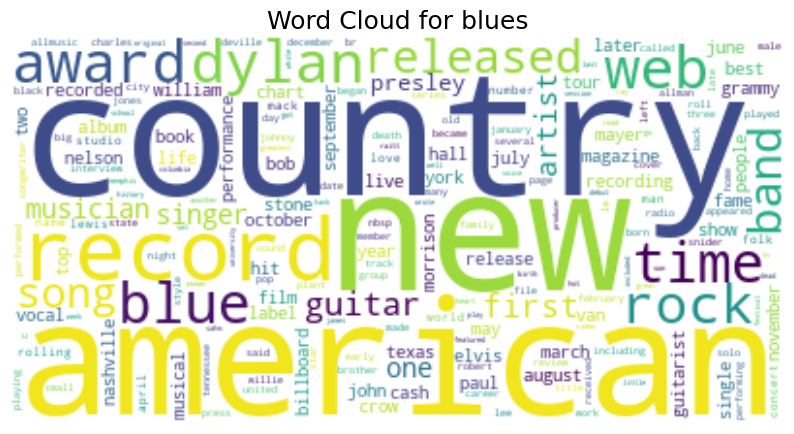

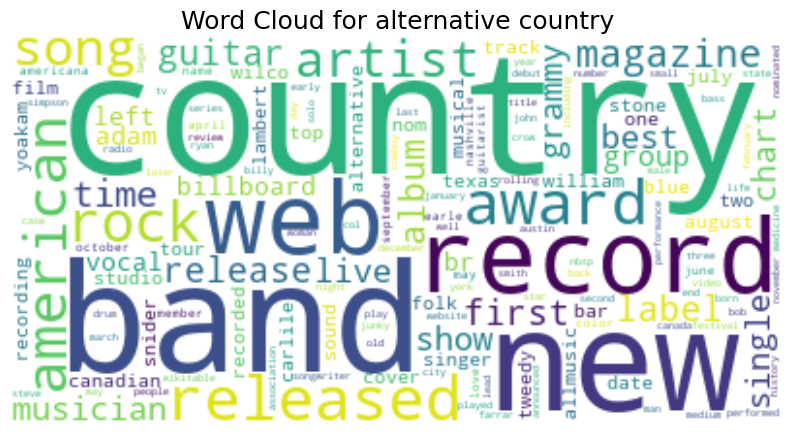

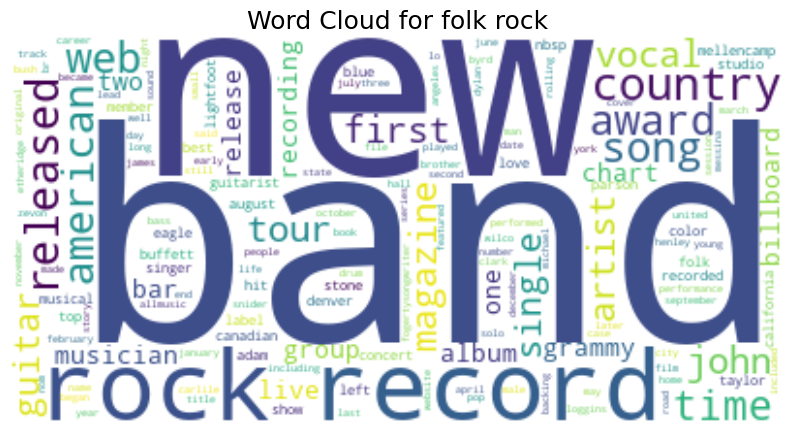

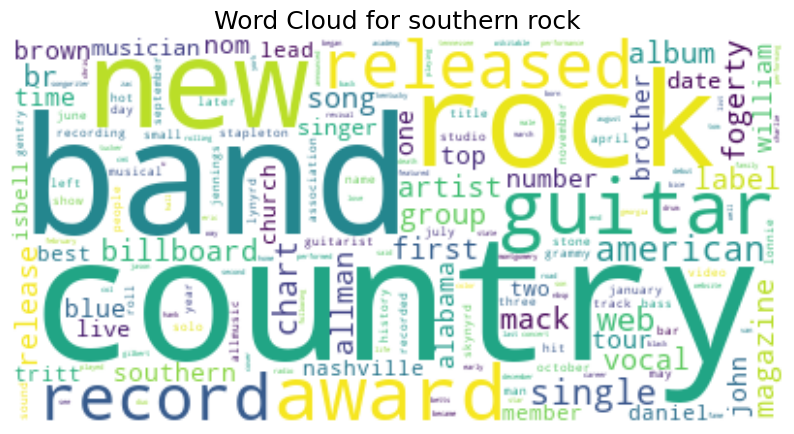

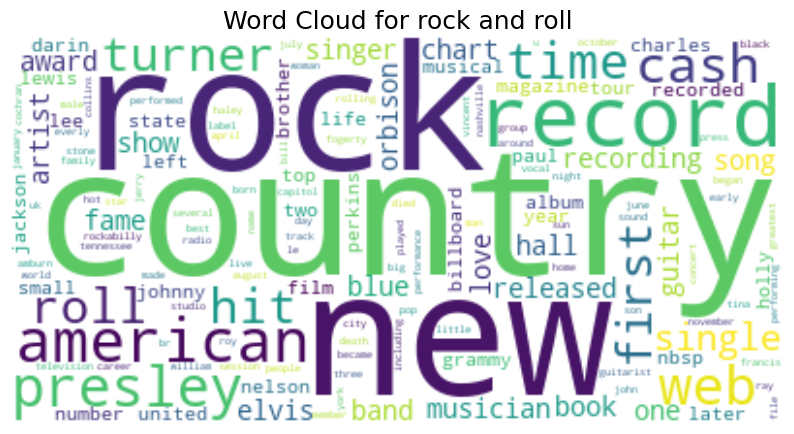

In [36]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import os

# Function to create word cloud from a TF list
def create_wordcloud(genre_name, tf_list):
    # Prepare a long string where words are repeated according to their frequency
    words = ' '.join([f'{word} ' * count for word, count in tf_list.items()])
    
    # Generate the word cloud
    wordcloud = WordCloud(collocations=False, background_color='white').generate(words)
    
    # Display the word cloud
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Word Cloud for {genre_name}", fontsize=18)
    plt.show()

# Function to process the TF lists and generate word clouds
def generate_wordclouds_for_genres(top_genres, output_folder):
    for genre in top_genres:
        file_path = os.path.join(output_folder, f'{genre}_tf_list.txt')
        if os.path.exists(file_path):
            # Read the term frequency list from the saved file
            with open(file_path, 'r', encoding='utf-8') as file:
                tf_list = {}
                for line in file:
                    word, count = line.split()
                    tf_list[word] = int(count)
            
            # Create a word cloud for the genre
            create_wordcloud(genre, tf_list)

# Define top 15 genres
top_genres = ['country', 'folk', 'country rock', 'pop', 'americana', 'bluegrass', 
              'rock', 'country pop', 'gospel', 'rockabilly', 'blues', 
              'alternative country', 'folk rock', 'southern rock', 'rock and roll']

# Folder containing the saved TF lists
output_folder = 'tf_lists'

# Generate word clouds for each genre
generate_wordclouds_for_genres(top_genres, output_folder)



# Part 5: Understanding TF-IDF

## TF-IDF Concepts and Explanations

### 1. **Alternative Term Frequency Definitions**
- **Log-Normalized Term Frequency**: 
  - Formula: `tf(t) = 1 + log(frequency of term t)`
  - **Why Preferable**: This reduces the impact of very frequent terms, giving less importance to extremely common words while emphasizing less frequent but important terms.

### 2. **What Does IDF Stand For?**
- **IDF**: Inverse Document Frequency. It reflects how unique or rare a word is across a larger corpus.

### 3. **How Does IDF Extract What's Special in a Text?**
- **Explanation**: IDF discounts words that appear frequently across all documents and highlights words that are unique or rare in specific texts, thus focusing on what's special or distinguishing about that document.

### 4. **Why Take the Log of IDF?**
- **Logarithmic Scaling**: The log smooths out extreme values, preventing rare words from having too much influence while balancing the weight of frequent words.

### 5. **Why Does IDF Make Stopword Removal Less Important?**
- **Explanation**: Since stopwords (like "the", "and", etc.) occur in almost every document, their IDF value is very low, meaning they naturally receive less weight, thus making explicit stopword removal less critical.



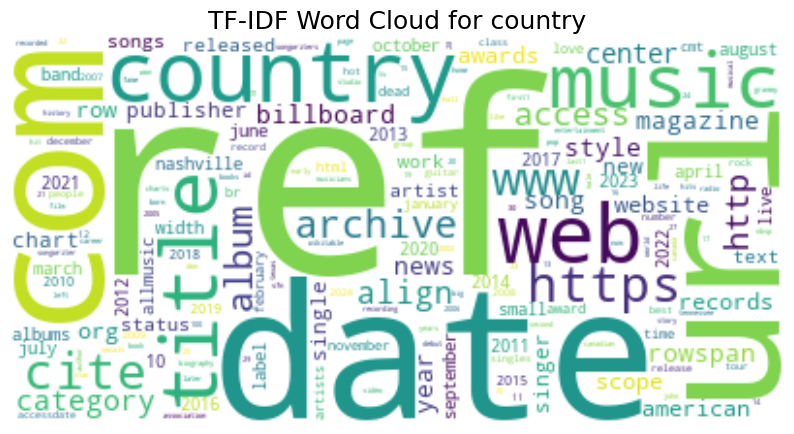

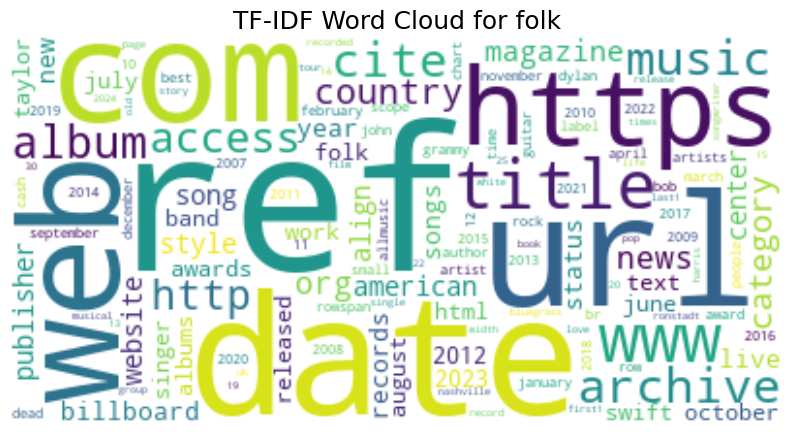

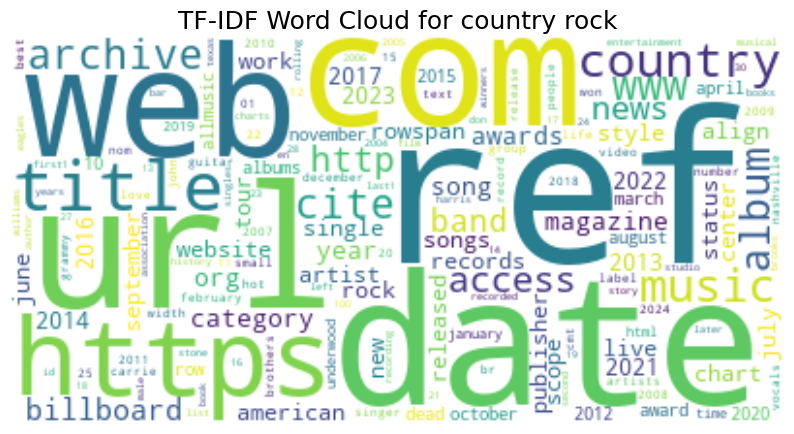

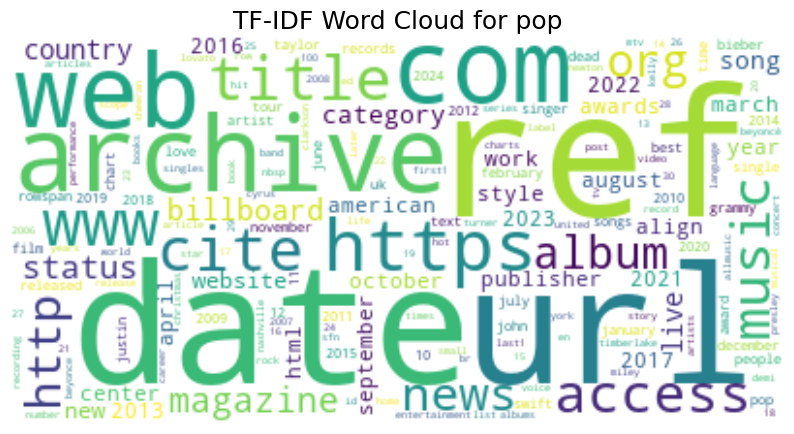

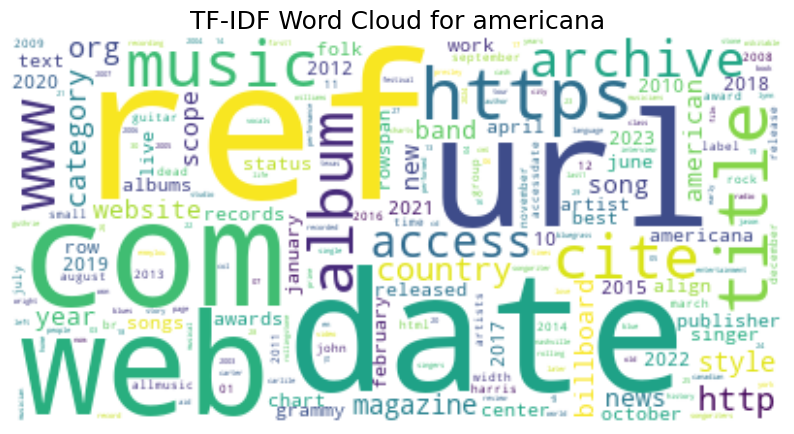

...

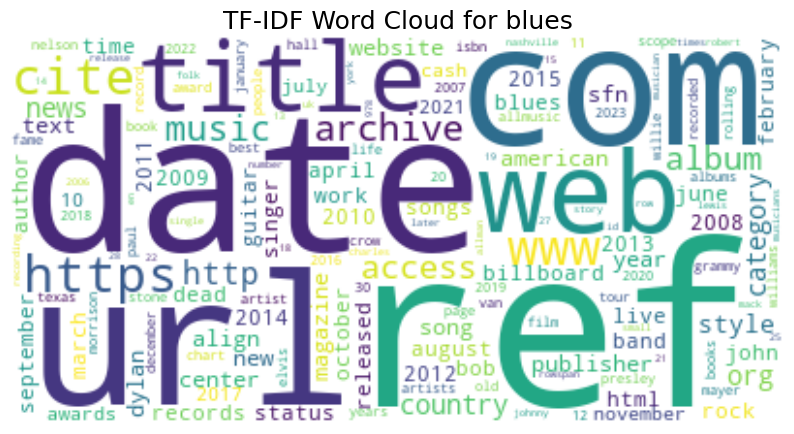

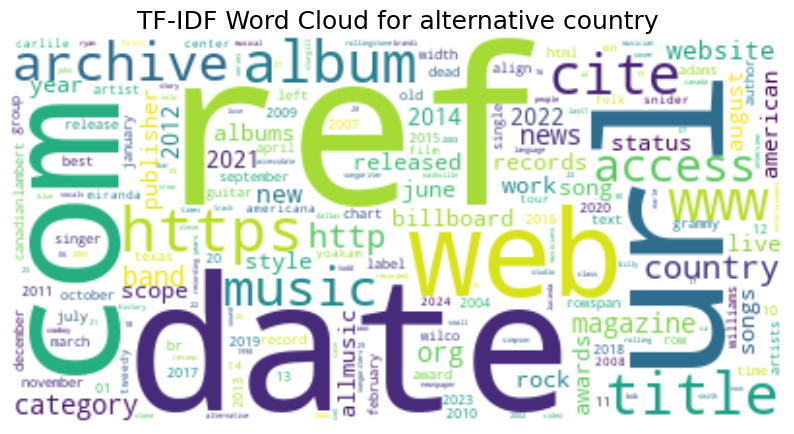

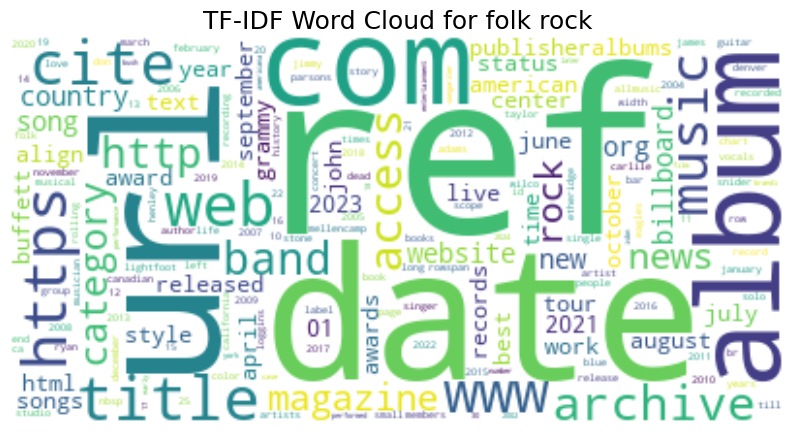

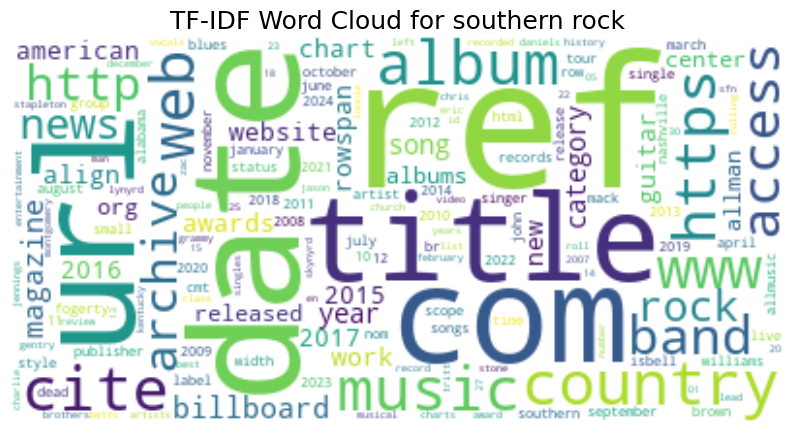

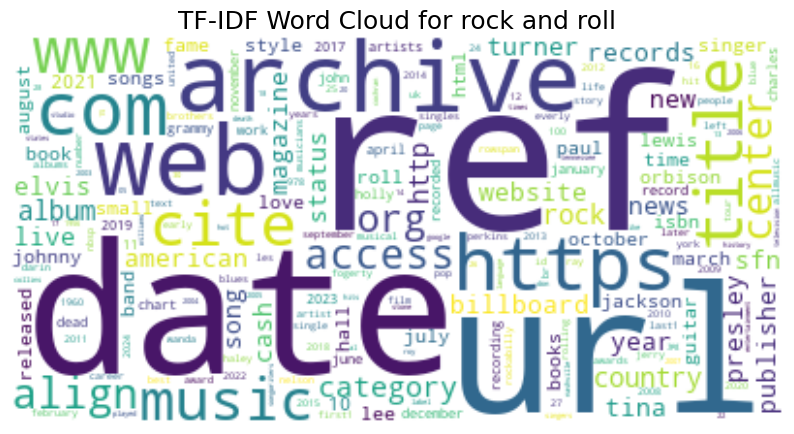

In [37]:
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import os

# Load all the text for each genre from the saved files
def load_genre_texts(genre_name, genre_data, artist_folder):
    genre_text = ""
    
    # Aggregate text for all artists in this genre
    for artist, genres in genre_data.items():
        if genre_name in genres:
            artist_file = artist.replace(" ", "_") + '.txt'
            artist_path = os.path.join(artist_folder, artist_file)
            if os.path.exists(artist_path):
                with open(artist_path, 'r', encoding='utf-8') as file:
                    genre_text += file.read() + " "  # Append text
    return genre_text

# Function to generate a word cloud using TF-IDF
def generate_tfidf_wordcloud(genre_name, texts, vectorizer):
    tfidf_matrix = vectorizer.fit_transform([texts])
    feature_names = vectorizer.get_feature_names_out()
    
    # Get TF-IDF scores for each word
    tfidf_scores = zip(feature_names, tfidf_matrix.toarray()[0])
    
    # Create a dictionary of words and their scores
    tfidf_dict = {word: score for word, score in tfidf_scores}
    
    # Generate word cloud using TF-IDF scores
    wordcloud = WordCloud(collocations=False, background_color='white').generate_from_frequencies(tfidf_dict)
    
    # Display the word cloud
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"TF-IDF Word Cloud for {genre_name}", fontsize=18)
    plt.show()

# Define top 15 genres
top_genres = ['country', 'folk', 'country rock', 'pop', 'americana', 'bluegrass', 
              'rock', 'country pop', 'gospel', 'rockabilly', 'blues', 
              'alternative country', 'folk rock', 'southern rock', 'rock and roll']

artist_folder = 'country_music_performers'
output_folder = 'tf_lists'

# Make sure the output folder exists
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Load the genre data
with open('genre.txt', 'r') as file:
    genre_data = json.load(file)

# Initialize TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words='english')

# Generate TF-IDF word clouds for each genre
for genre in top_genres:
    genre_text = load_genre_texts(genre, genre_data, artist_folder)
    generate_tfidf_wordcloud(genre, genre_text, vectorizer)


# Part 6: Genres and TF-IDF word-clouds

Top 10 words for country by TF-IDF: [('ref', 0.4642106058747811), ('date', 0.3043621235269176), ('url', 0.2701357090360374), ('com', 0.23918548231734615), ('country', 0.23126842478368187), ('music', 0.19271021484945738), ('title', 0.1820970782637885), ('https', 0.18162633430232739), ('cite', 0.1797338484774635), ('www', 0.1710131977166585)]


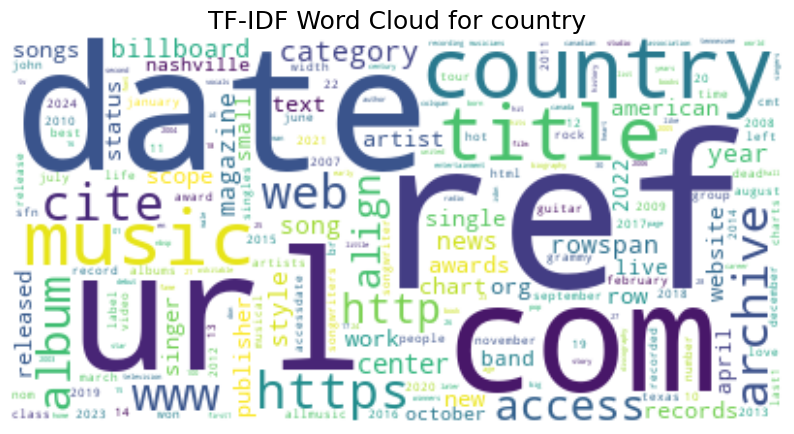

Top 10 words for folk by TF-IDF: [('ref', 0.4950243038075581), ('date', 0.32695179035951516), ('url', 0.287609775372876), ('com', 0.2387470935072679), ('https', 0.19905246122881506), ('www', 0.1898340377428292), ('archive', 0.18351211343959845), ('title', 0.18192533562643695), ('cite', 0.1810941662957333), ('web', 0.1801874361167839)]


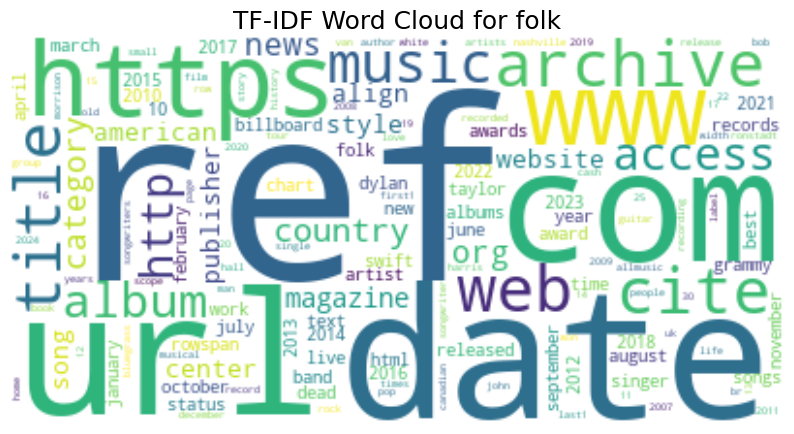

Top 10 words for country rock by TF-IDF: [('ref', 0.45448476216157796), ('date', 0.3186131553276996), ('url', 0.29023507043195274), ('com', 0.24961445432666887), ('https', 0.20110534530812682), ('country', 0.19477918378353343), ('web', 0.18855547021885247), ('music', 0.18563570336134783), ('archive', 0.18402214799272684), ('title', 0.18374041610296762)]


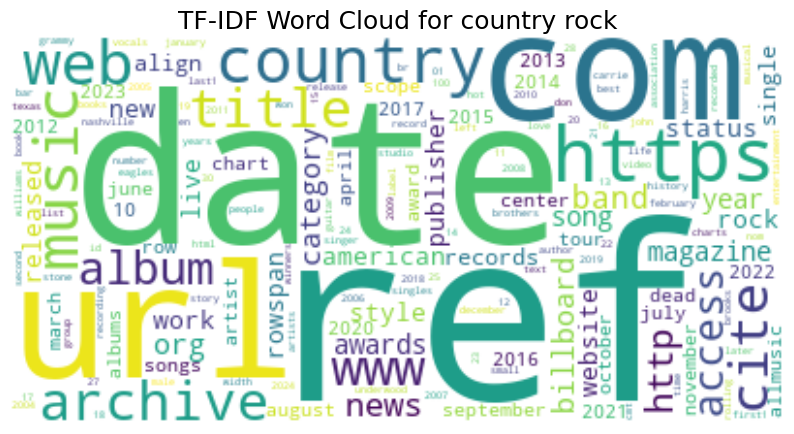

Top 10 words for pop by TF-IDF: [('ref', 0.4058027473104875), ('date', 0.3566107338707131), ('url', 0.3402459212387225), ('archive', 0.2758181836023844), ('com', 0.2547558055044816), ('https', 0.2503091485797755), ('web', 0.22598495944619482), ('www', 0.19805047519192795), ('title', 0.17371234669494692), ('cite', 0.1705481112030714)]


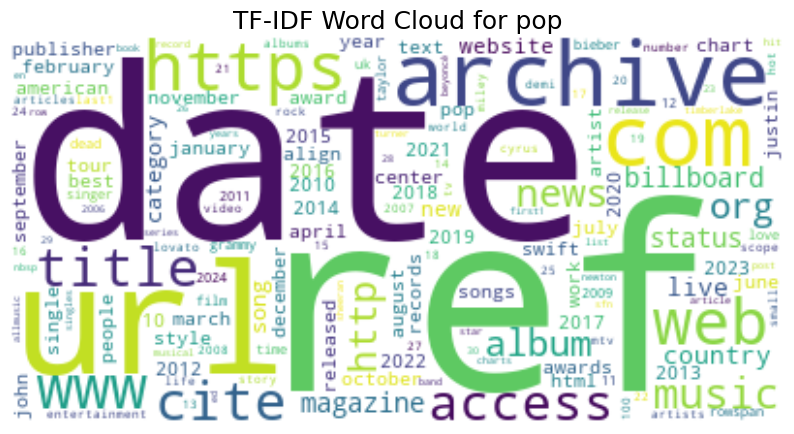

Top 10 words for americana by TF-IDF: [('ref', 0.4766259365189766), ('date', 0.31273577838579997), ('url', 0.283089189032945), ('com', 0.2543616099126125), ('https', 0.19942522045737943), ('music', 0.19309426107778008), ('www', 0.18666118945012267), ('title', 0.1848912438171164), ('cite', 0.1823044001996457), ('web', 0.18138538996712322)]


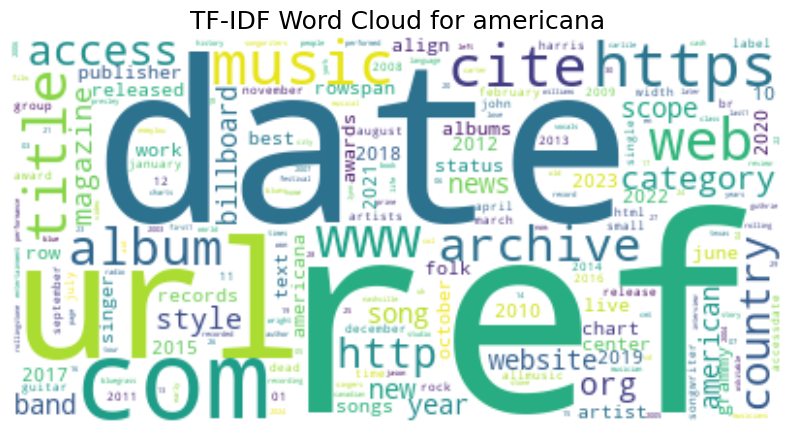

Top 10 words for bluegrass by TF-IDF: [('ref', 0.5008111072076539), ('date', 0.2931699778697022), ('url', 0.2461341363739804), ('com', 0.2409581837307546), ('music', 0.21678698740656419), ('country', 0.19452536584395225), ('title', 0.18563076761238947), ('cite', 0.18050506693657362), ('www', 0.17316827969471957), ('album', 0.17241450018357019)]


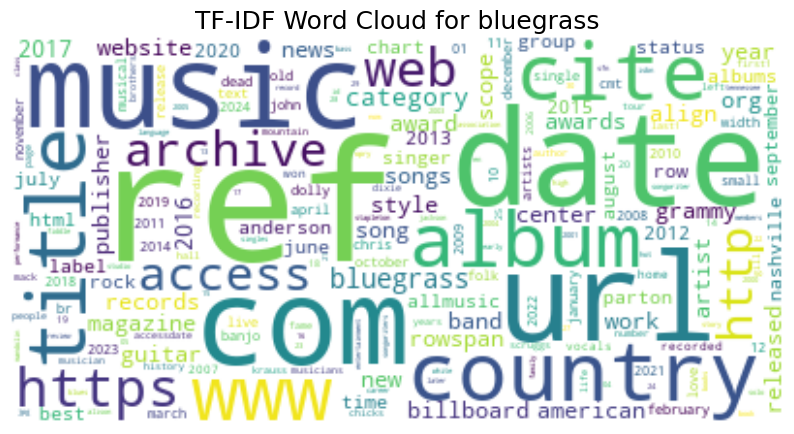

Top 10 words for rock by TF-IDF: [('ref', 0.44960419115283623), ('date', 0.3412042269490363), ('url', 0.3134139531071659), ('com', 0.2468911448858717), ('archive', 0.22738426453504637), ('https', 0.21626304179243955), ('web', 0.20843983682867473), ('www', 0.19143842734859762), ('title', 0.1815699400413649), ('cite', 0.18070069504539102)]


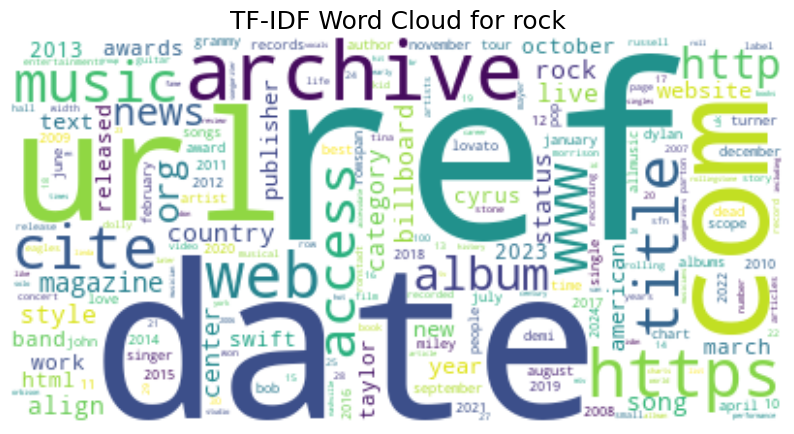

Top 10 words for country pop by TF-IDF: [('ref', 0.4570391383231847), ('date', 0.3212481929985987), ('url', 0.2903295553272249), ('com', 0.25649097570453866), ('country', 0.22690950771180327), ('https', 0.20701569759491756), ('web', 0.1902055644920347), ('title', 0.18777682772879353), ('music', 0.18474772906902082), ('cite', 0.18373802951576323)]


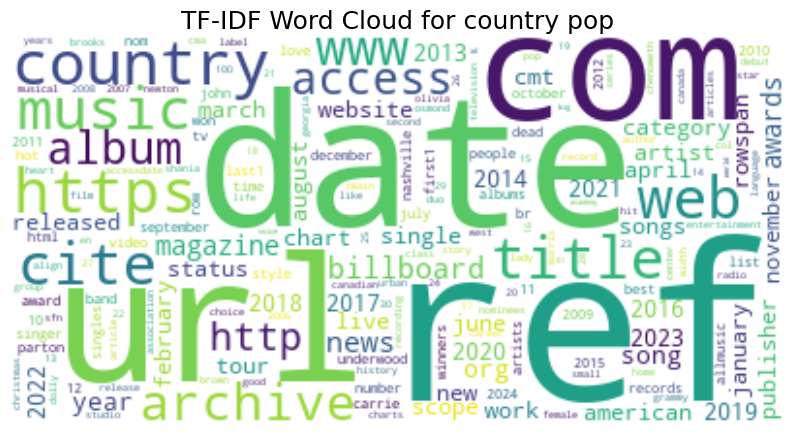

Top 10 words for gospel by TF-IDF: [('ref', 0.4693220042586434), ('date', 0.31637683412309575), ('url', 0.27545894634764334), ('com', 0.23481521527420407), ('music', 0.19955180947777149), ('https', 0.19883214813498715), ('title', 0.1945827192537844), ('cite', 0.19084733418885616), ('country', 0.18221139807544412), ('www', 0.18029230116135253)]


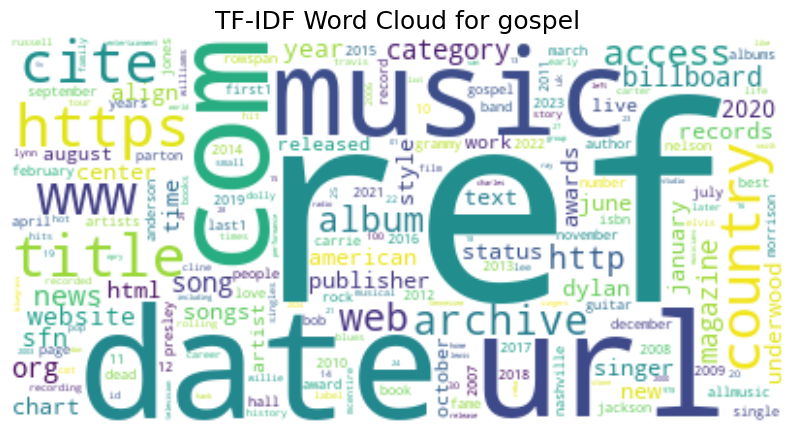

Top 10 words for rockabilly by TF-IDF: [('ref', 0.44882494662947503), ('date', 0.27377778842267964), ('url', 0.25175147343343285), ('com', 0.2263126307697958), ('https', 0.20188203491904674), ('music', 0.18575008591283787), ('country', 0.1778392263040239), ('archive', 0.17504715820679545), ('title', 0.17202241776813126), ('www', 0.16690362625654576)]


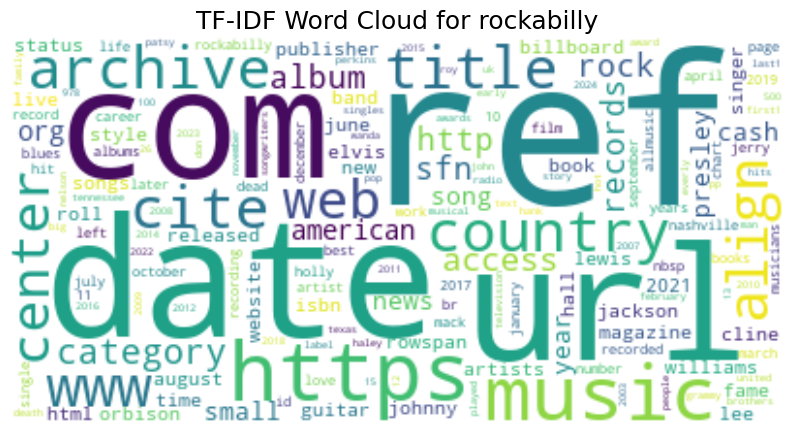

Top 10 words for blues by TF-IDF: [('ref', 0.4577957579479492), ('date', 0.3247232433064373), ('url', 0.2871034022644547), ('com', 0.25364892823761), ('title', 0.19379918112536496), ('https', 0.19349225934530215), ('www', 0.18893227861294062), ('cite', 0.18730997777546585), ('web', 0.1847230656292223), ('archive', 0.1838461462576143)]


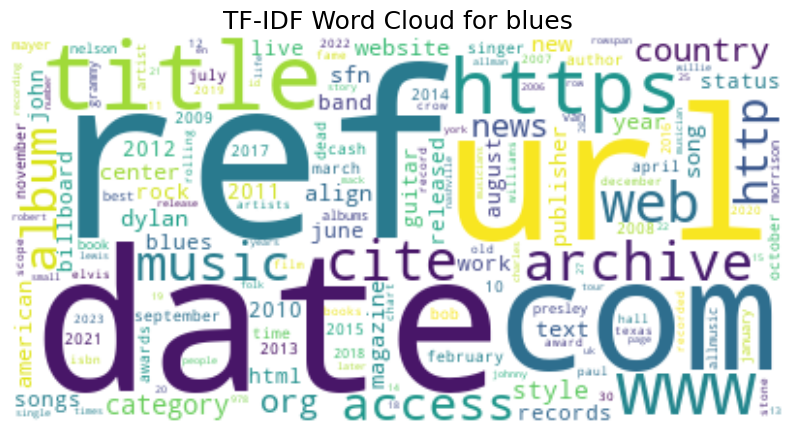

Top 10 words for alternative country by TF-IDF: [('ref', 0.4685462872785584), ('date', 0.3314913380481783), ('url', 0.2910353590584878), ('com', 0.2504417746980841), ('https', 0.20503200236271718), ('album', 0.19388596733494531), ('title', 0.18851935787712923), ('www', 0.18562964509215132), ('cite', 0.18315274841931314), ('web', 0.17943740341005585)]


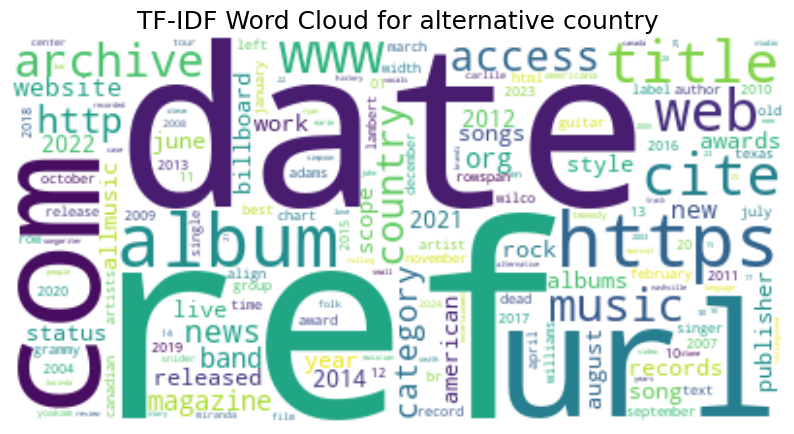

Top 10 words for folk rock by TF-IDF: [('ref', 0.4923448396069479), ('date', 0.30532792311467355), ('url', 0.27275676044814556), ('com', 0.24011432609088124), ('album', 0.2178775585811291), ('title', 0.19948946237114176), ('cite', 0.1954269759991678), ('https', 0.19043795764762086), ('www', 0.17568471766518914), ('web', 0.1582231534347748)]


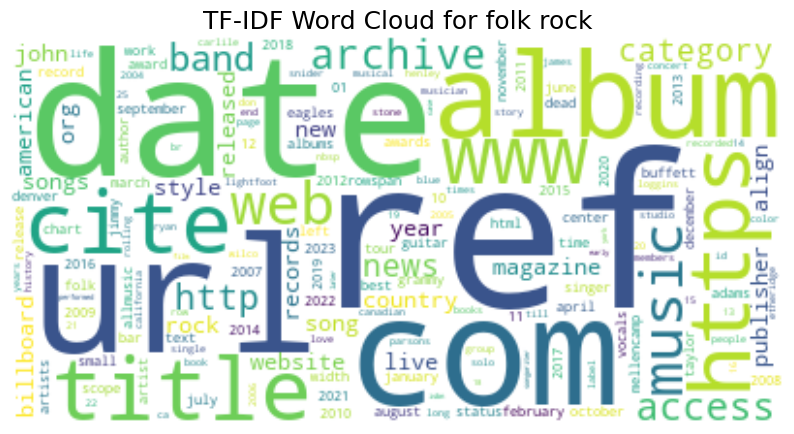

Top 10 words for southern rock by TF-IDF: [('ref', 0.4857315942928631), ('date', 0.31684216064505727), ('url', 0.2536332462810024), ('com', 0.2518386714252406), ('country', 0.18763277103020698), ('cite', 0.18514030595276001), ('title', 0.18484121014346638), ('music', 0.17885929395759367), ('album', 0.17487134983367855), ('www', 0.16210992863715012)]


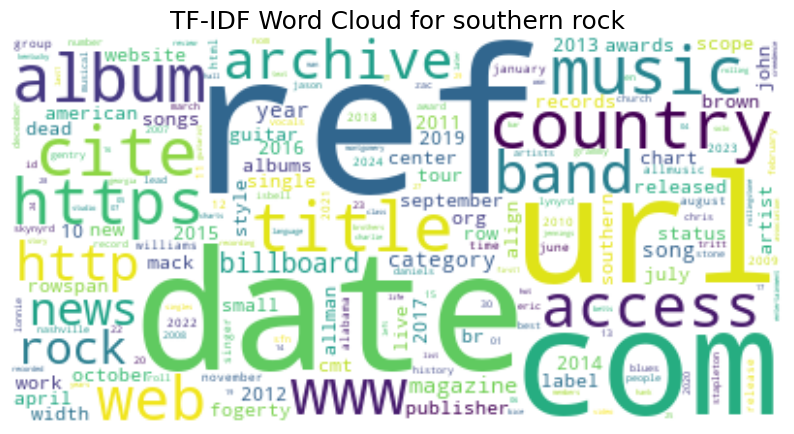

Top 10 words for rock and roll by TF-IDF: [('ref', 0.43479007283391335), ('date', 0.30608431428457994), ('url', 0.2993263128032285), ('archive', 0.24230092951676868), ('https', 0.23645411924638599), ('com', 0.2288608591549799), ('web', 0.18747759165681663), ('title', 0.17631549932244966), ('www', 0.17601176891879342), ('cite', 0.1678869806209889)]


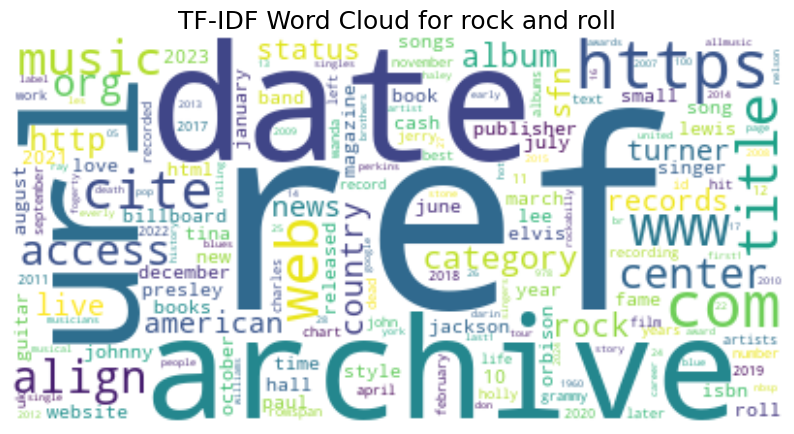

In [39]:
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import os

# List of unwanted tokens to exclude
unwanted_tokens = {'ref', 'url', 'https', 'cite', 'com', 'web', 'date', 'title'}

# Load all the text for each genre from the saved files
def load_genre_texts(genre_name, genre_data, artist_folder):
    genre_text = ""
    
    # Aggregate text for all artists in this genre
    for artist, genres in genre_data.items():
        if genre_name in genres:
            artist_file = artist.replace(" ", "_") + '.txt'
            artist_path = os.path.join(artist_folder, artist_file)
            if os.path.exists(artist_path):
                with open(artist_path, 'r', encoding='utf-8') as file:
                    genre_text += file.read() + " "  # Append text
    return genre_text

# Preprocess the text to remove unwanted tokens
def preprocess_text(text):
    tokens = text.split()  # Split the text into tokens
    filtered_tokens = [token for token in tokens if token.lower() not in unwanted_tokens]  # Remove unwanted tokens
    return ' '.join(filtered_tokens)  # Join the filtered tokens back into a single string

# Function to generate a word cloud using TF-IDF
def generate_tfidf_wordcloud(genre_name, texts, vectorizer):
    # Preprocess the text
    texts = preprocess_text(texts)
    
    tfidf_matrix = vectorizer.fit_transform([texts])
    feature_names = vectorizer.get_feature_names_out()
    
    # Get TF-IDF scores for each word
    tfidf_scores = zip(feature_names, tfidf_matrix.toarray()[0])
    
    # Create a dictionary of words and their scores
    tfidf_dict = {word: score for word, score in tfidf_scores}
    
    # Get the top 10 words by TF-IDF
    top_10_words = sorted(tfidf_dict.items(), key=lambda item: item[1], reverse=True)[:10]
    print(f"Top 10 words for {genre_name} by TF-IDF: {top_10_words}")
    
    # Generate word cloud using TF-IDF scores
    wordcloud = WordCloud(collocations=False, background_color='white').generate_from_frequencies(tfidf_dict)
    
    # Display the word cloud
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"TF-IDF Word Cloud for {genre_name}", fontsize=18)
    plt.show()

# Define top 15 genres
top_genres = ['country', 'folk', 'country rock', 'pop', 'americana', 'bluegrass', 
              'rock', 'country pop', 'gospel', 'rockabilly', 'blues', 
              'alternative country', 'folk rock', 'southern rock', 'rock and roll']

artist_folder = 'country_music_performers'
output_folder = 'tf_lists'

# Make sure the output folder exists
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Load the genre data
with open('genre.txt', 'r') as file:
    genre_data = json.load(file)

# Initialize TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words='english')

# Generate TF-IDF word clouds for each genre
for genre in top_genres:
    genre_text = load_genre_texts(genre, genre_data, artist_folder)
    generate_tfidf_wordcloud(genre, genre_text, vectorizer)
